# Deep Learning

To use Deep Learning you need data, a lot of data. 
The idea behind the Deep Learning, look at the human brain and mimic how human brain operates.


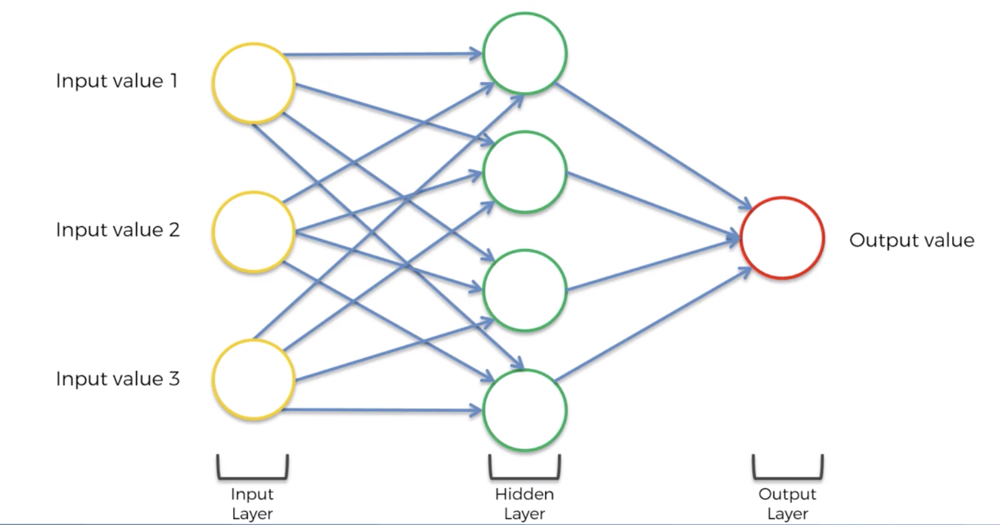

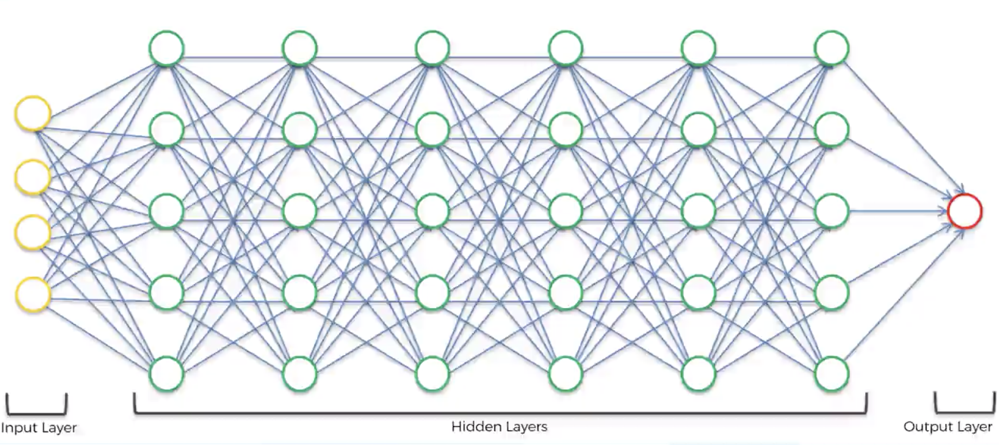



In this part you will learn:

- The Intuition of ANNs

- How to build an ANN

- How to predict the outcome of a single observation (Homework Challenge)

- How to evaluate the performance of an ANN with k-Fold Cross Validation

- How to tackle overfitting with Dropout

- How to do some Parameter Tuning on your ANN to improve its performance


# The Neuron

Each indipendent variables is one for each observation. 


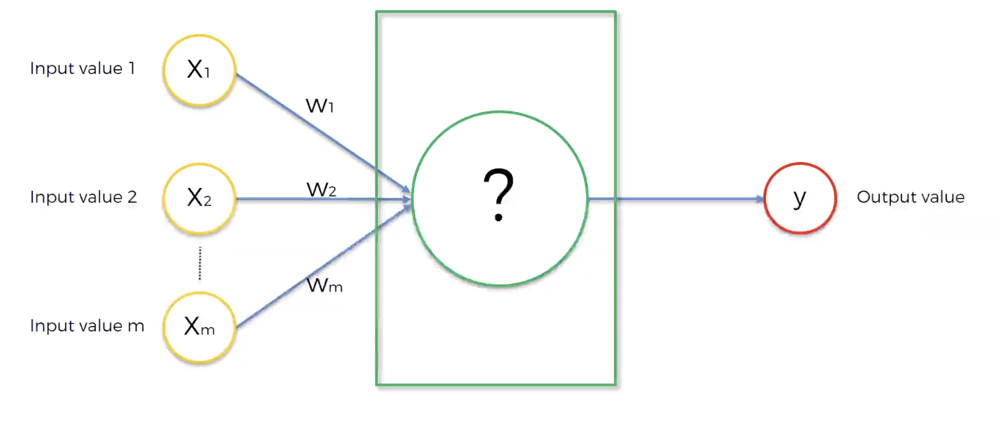


# The Activation Function

We have 4 different types of activation function. 

## Threshold function
is a yes/no type of function. 

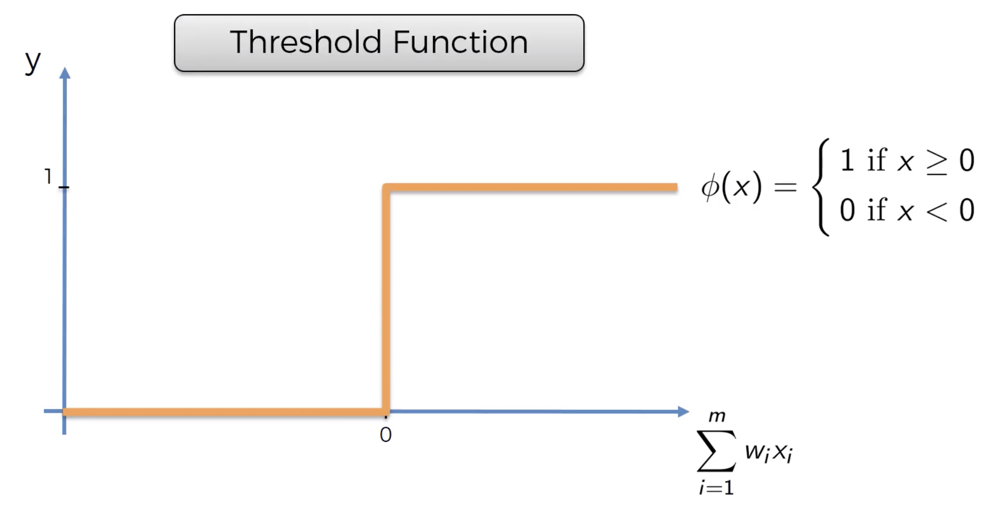


## Sigmoid function 

Is used for the probability of a class.

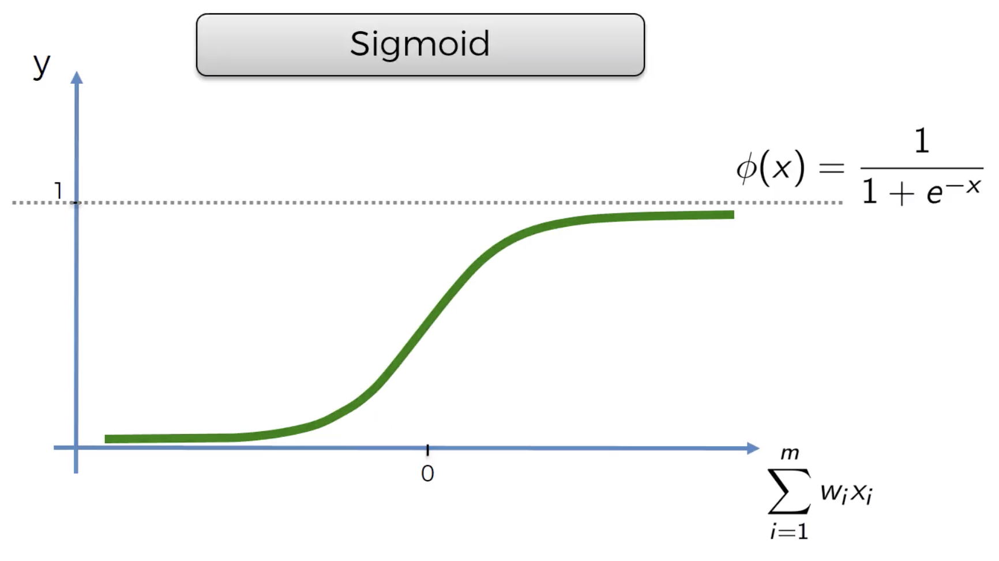


## Rectifier function 

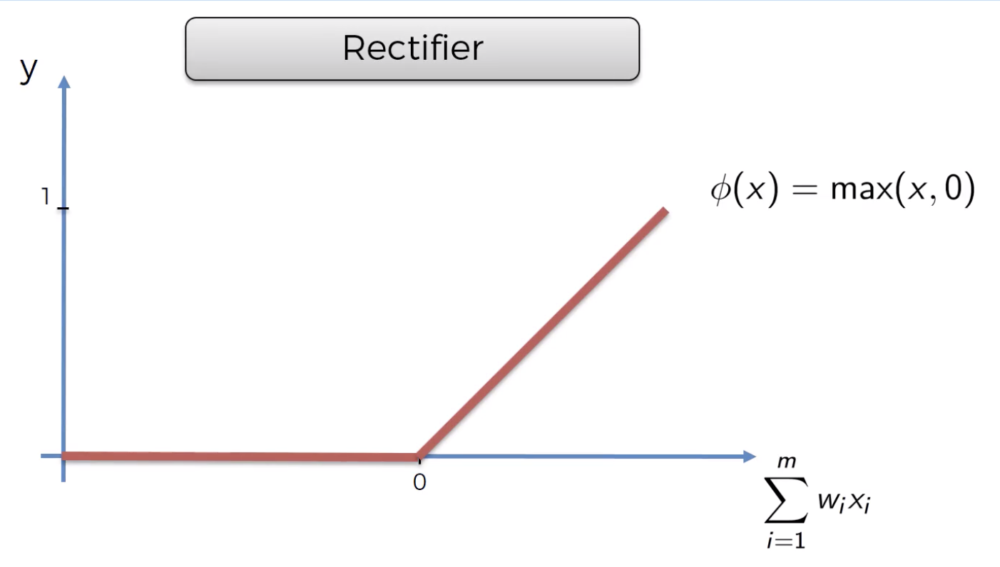


## Hyperbolic Tangent (tanh)


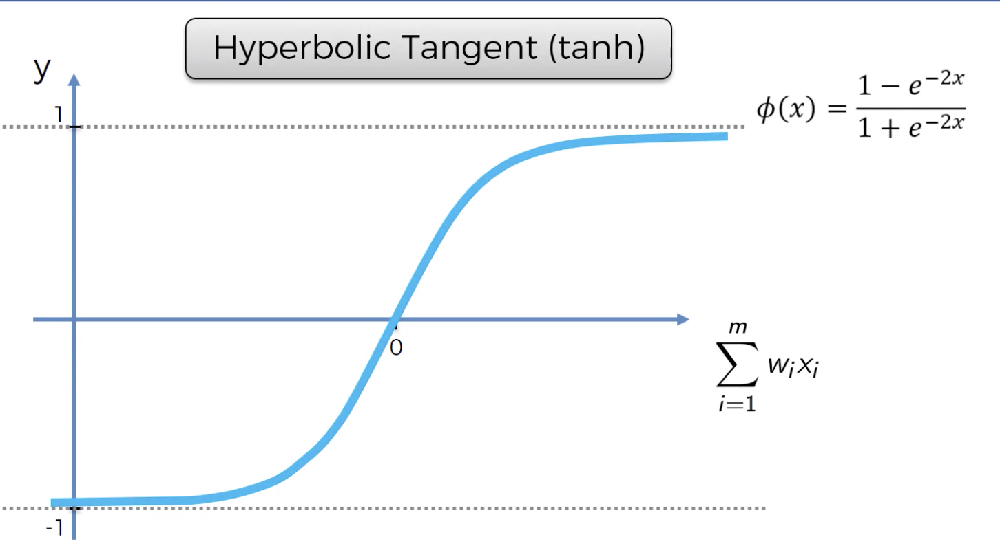


Assuming the output is binary (0 or 1) which kind of activation function you would use? 

# How do Neural Networks work? 

We want to see a previous example. How much does cost an house? 
It is a Regression problem.

Input parameters: 
- Area 
- Bedrooms 
- Distance to city 
- Age


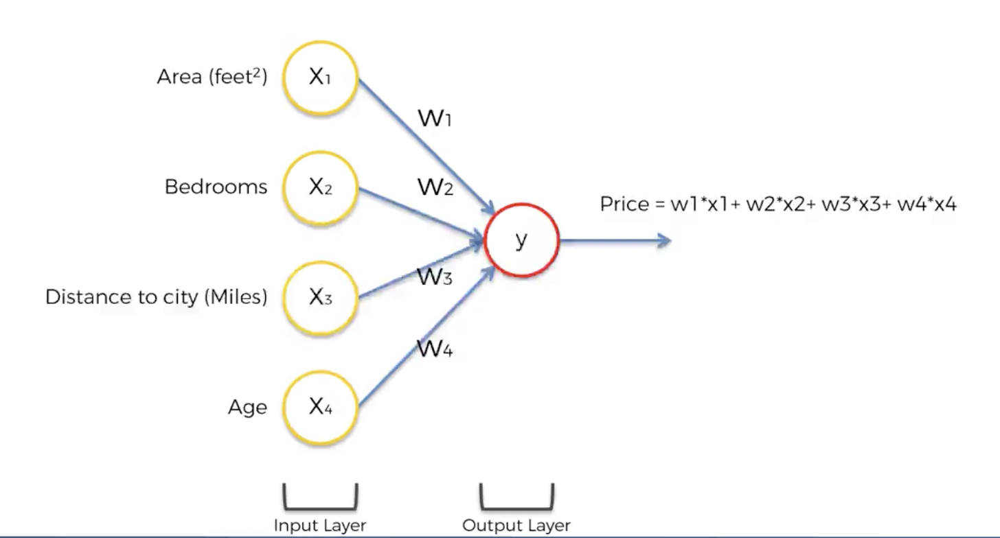


The streight of the neural network is to combine the parameters in order to collect useful informations for the aim, the regression for example. 


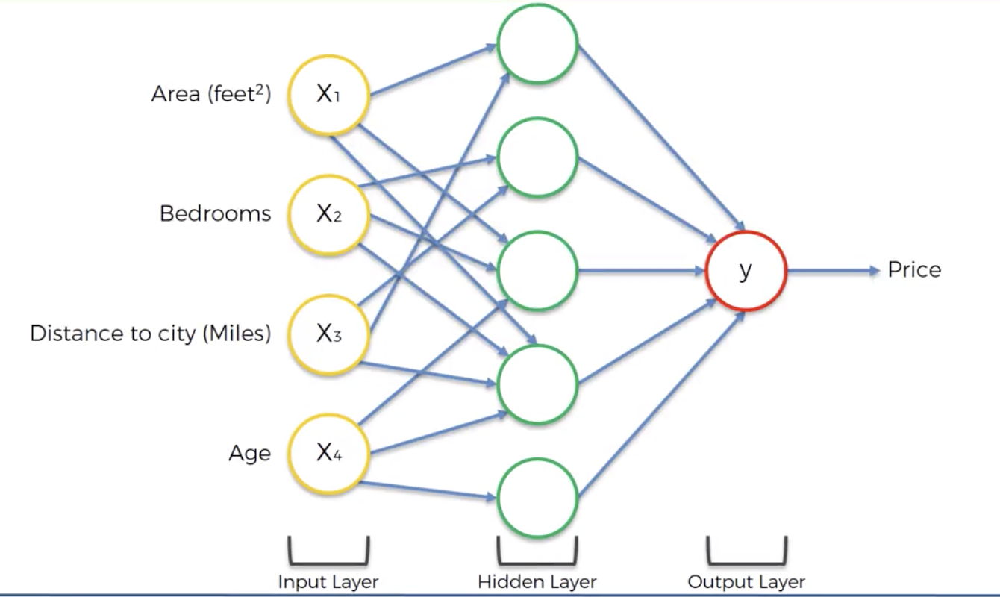




# How do Neural Networks learn? 

Hard coded coding // Neural network 

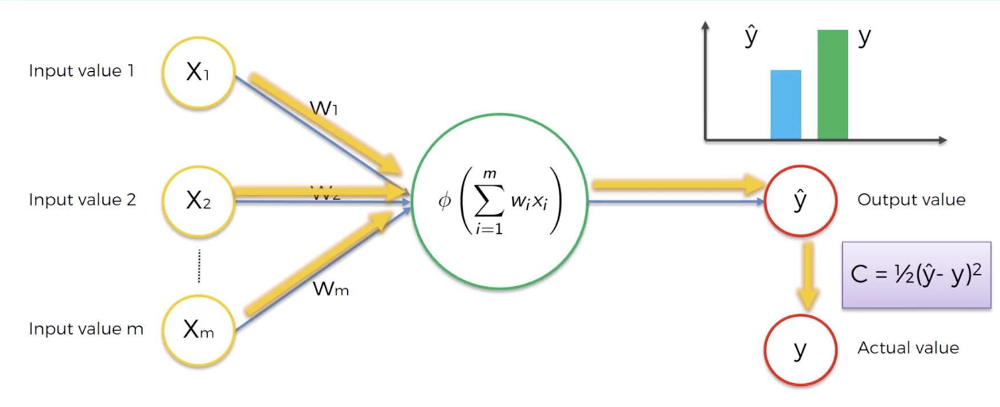


All we can do is update the weights. 

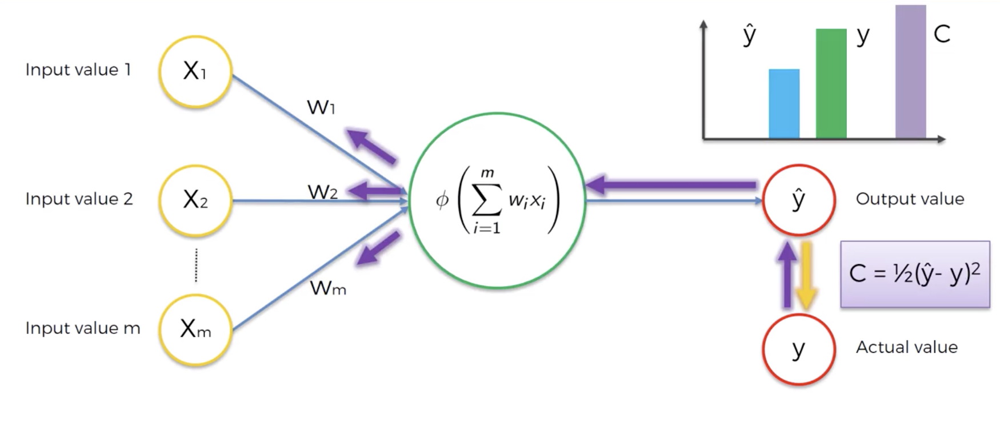



You have to train you model until the cost function is near to 0. 

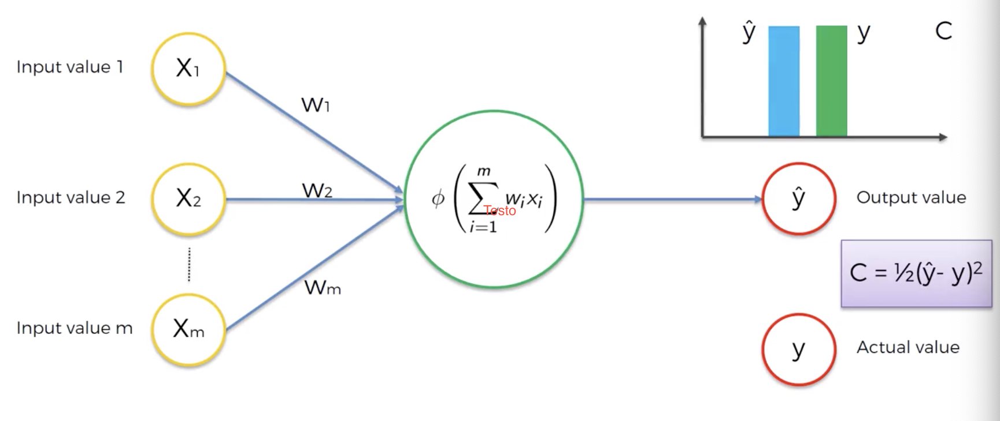


You have to do this process for each row in your data. Each iteration adjust the value of w1, w2, w3 ... 


# Gradient Descent
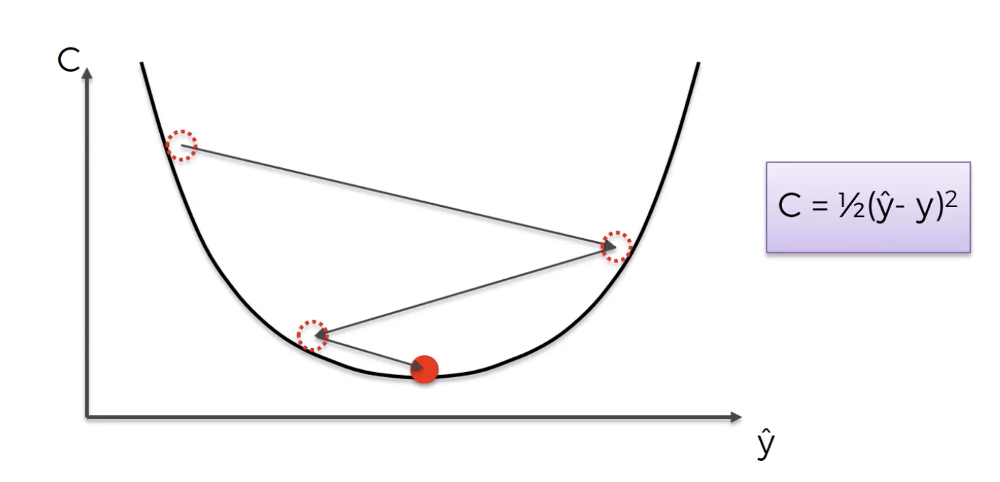
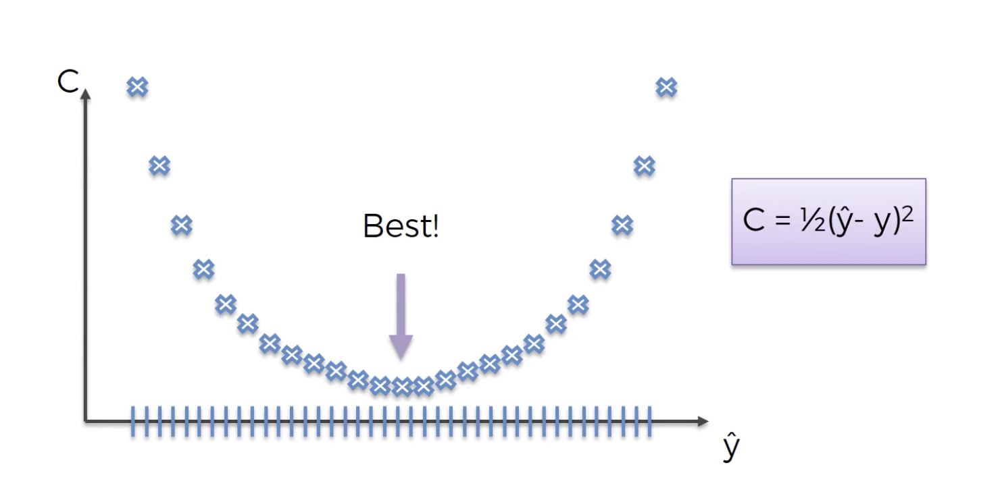




We should try each combination of weight to find the minimum... this is impossible. 


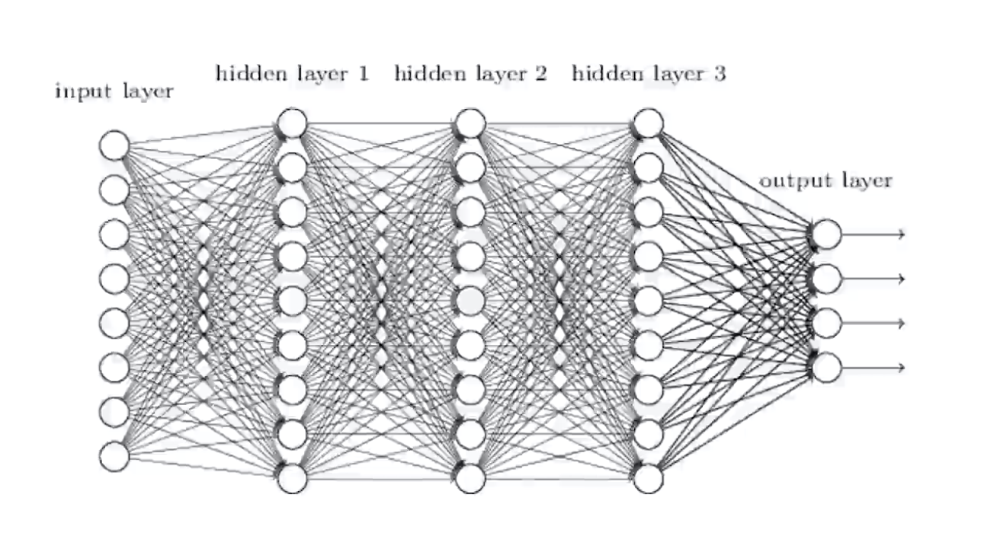


# Stochastic Gradient Descent

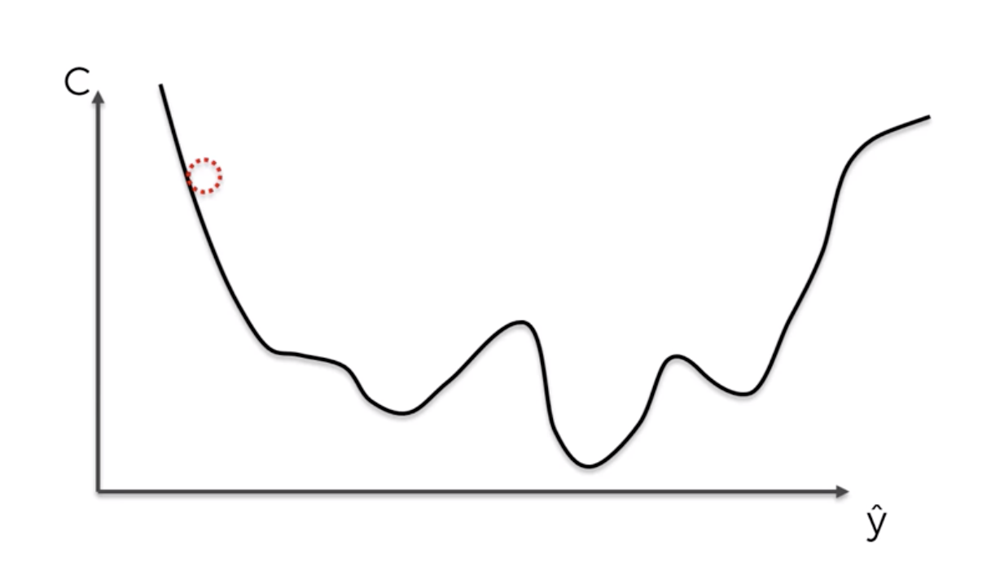
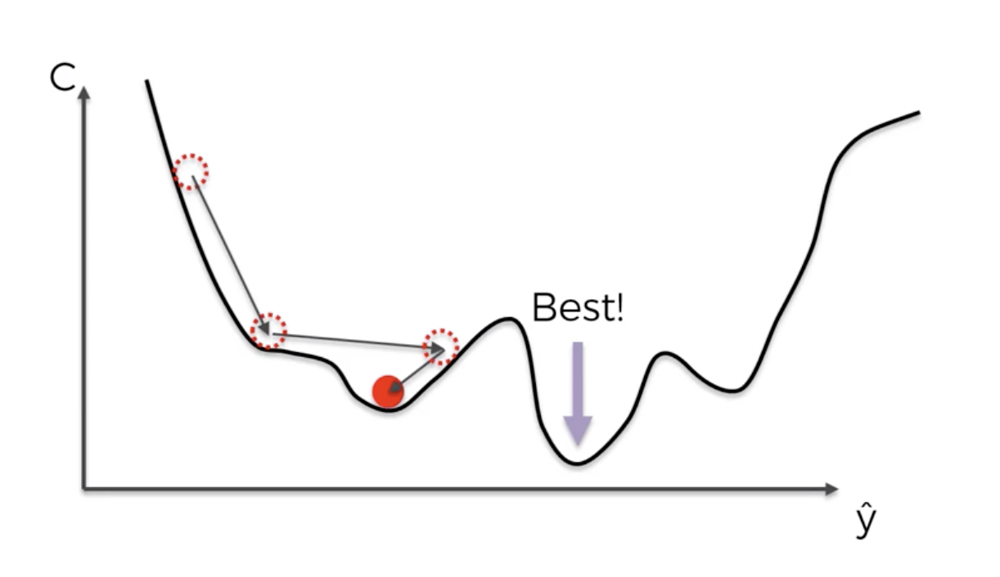
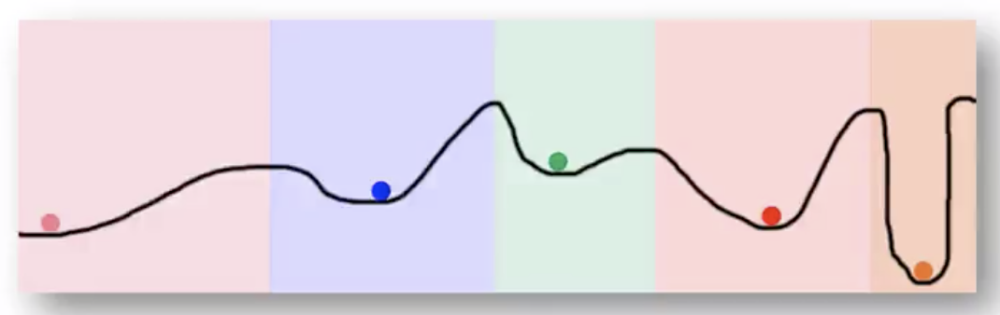



# Build a Neural Network

We want to predict which customers will leave the bank. So it is a classification problem. 

- Install keras library ---> conda install -c conda-forge keras  ( or ---> pip install keras )
- Install Theano library ---> pip install theano
- Install Tensorflow library ---> pip install tensorflow

conda update --all




#### Theano  is an open source numerical computation library. With Theano you can run your code on GPU or CPU. 
#### TensorFlow is an open source numerical computation library that can run really fast computations. 
Theese two libraries are used mostly for research and developing purposes in deep learning fields. 
#### Keras is an amazing library to build deep neural networks model in a very few lines of code. Keras is based in Theano and Tensorflow. 



Take a look to 4_Churn_Modeling.csv file.

## Part 1 - Data propressing 
Prepare data correctly. 

In [1]:
# Classification template
# Importing the libraries
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

In [2]:
# Importing the dataset
dataset = pd.read_csv('4_Churn_Modelling.csv')
dataset   # information of customers of the bank

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,9996,15606229,Obijiaku,771,France,Male,39,5,0.00,2,1,0,96270.64,0
9996,9997,15569892,Johnstone,516,France,Male,35,10,57369.61,1,1,1,101699.77,0
9997,9998,15584532,Liu,709,France,Female,36,7,0.00,1,0,1,42085.58,1
9998,9999,15682355,Sabbatini,772,Germany,Male,42,3,75075.31,2,1,0,92888.52,1


### CreditScore :  have impact to the decision to stay or leave the bank
### Geography : people tent to have same bank of their neighbors or friends.
### Gender: perhaps man has more tendency to leave than woman or viceversa. 
### Age : younger people have more probabilities to leave a bank than old people that have more stability. 
### Tenure : according to your tenure you are more likely to stay or leave a bank
### Balance : a person with 0 balance are more likely to leave than a person with an high balance 
### NumOfproducts : we cannot know if it has an impact but we can use it as well 
### Has Credit Card : we might expect that a person with the credit card is more likely to stay 
### Is Active member : customer active member is more likely to stay in a bank 
### Estimated Salary : customer with an high salary is more likely to stay in a bank 

### Exited : is the class, 0 if a person left the bank, 1 otherwise


In [3]:
X = dataset.iloc[:, 3:13].values   # upperbound is not included
y = dataset.iloc[:, 13].values    # class

In [4]:
df_X = pd.DataFrame(X)
df_X

,0,1,2,3,4,5,6,7,8,9
0,619,France,Female,42,2,0,1,1,1,101349
1,608,Spain,Female,41,1,83807.9,1,0,1,112543
2,502,France,Female,42,8,159661,3,1,0,113932
3,699,France,Female,39,1,0,2,0,0,93826.6
4,850,Spain,Female,43,2,125511,1,1,1,79084.1
...,...,...,...,...,...,...,...,...,...,...
9995,771,France,Male,39,5,0,2,1,0,96270.6
9996,516,France,Male,35,10,57369.6,1,1,1,101700
9997,709,France,Female,36,7,0,1,0,1,42085.6
9998,772,Germany,Male,42,3,75075.3,2,1,0,92888.5


In [5]:
pd.DataFrame(y).shape

(10000, 1)

#### Before split dataset in training set and test set we have to transform the categorical data in numerical data 

In [6]:
# Encoding categorical data
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

In [7]:
labelencoder_X_1 = LabelEncoder()
X[:, 1] = labelencoder_X_1.fit_transform(X[:, 1])
pd.DataFrame(X)

,0,1,2,3,4,5,6,7,8,9
0,619,0,Female,42,2,0,1,1,1,101349
1,608,2,Female,41,1,83807.9,1,0,1,112543
2,502,0,Female,42,8,159661,3,1,0,113932
3,699,0,Female,39,1,0,2,0,0,93826.6
4,850,2,Female,43,2,125511,1,1,1,79084.1
...,...,...,...,...,...,...,...,...,...,...
9995,771,0,Male,39,5,0,2,1,0,96270.6
9996,516,0,Male,35,10,57369.6,1,1,1,101700
9997,709,0,Female,36,7,0,1,0,1,42085.6
9998,772,1,Male,42,3,75075.3,2,1,0,92888.5


In [8]:
labelencoder_X_2 = LabelEncoder()
X[:, 2] = labelencoder_X_2.fit_transform(X[:, 2])
pd.DataFrame(X)

,0,1,2,3,4,5,6,7,8,9
0,619,0,0,42,2,0,1,1,1,101349
1,608,2,0,41,1,83807.9,1,0,1,112543
2,502,0,0,42,8,159661,3,1,0,113932
3,699,0,0,39,1,0,2,0,0,93826.6
4,850,2,0,43,2,125511,1,1,1,79084.1
...,...,...,...,...,...,...,...,...,...,...
9995,771,0,1,39,5,0,2,1,0,96270.6
9996,516,0,1,35,10,57369.6,1,1,1,101700
9997,709,0,0,36,7,0,1,0,1,42085.6
9998,772,1,1,42,3,75075.3,2,1,0,92888.5


In [9]:
## Create the dummy variables
onehotencoder = OneHotEncoder(categorical_features = [1])
X = onehotencoder.fit_transform(X).toarray()
pd.DataFrame(X)

/Users/Paola/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
/Users/Paola/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/_encoders.py:451: DeprecationWarning: The 'categorical_features' keyword is deprecated in version 0.20 and will be removed in 0.22. You can use the ColumnTransformer instead.
  "use the ColumnTransformer instead.", DeprecationWarning)


,0,1,2,3,4,5,6,7,8,9,10,11
0,1.0,0.0,0.0,619.0,0.0,42.0,2.0,0.00,1.0,1.0,1.0,101348.88
1,0.0,0.0,1.0,608.0,0.0,41.0,1.0,83807.86,1.0,0.0,1.0,112542.58
2,1.0,0.0,0.0,502.0,0.0,42.0,8.0,159660.80,3.0,1.0,0.0,113931.57
3,1.0,0.0,0.0,699.0,0.0,39.0,1.0,0.00,2.0,0.0,0.0,93826.63
4,0.0,0.0,1.0,850.0,0.0,43.0,2.0,125510.82,1.0,1.0,1.0,79084.10
...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1.0,0.0,0.0,771.0,1.0,39.0,5.0,0.00,2.0,1.0,0.0,96270.64
9996,1.0,0.0,0.0,516.0,1.0,35.0,10.0,57369.61,1.0,1.0,1.0,101699.77
9997,1.0,0.0,0.0,709.0,0.0,36.0,7.0,0.00,1.0,0.0,1.0,42085.58
9998,0.0,1.0,0.0,772.0,1.0,42.0,3.0,75075.31,2.0,1.0,0.0,92888.52


In [10]:
## is not necessary to do the same for Male and Female because is a binary value
# Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

In [11]:
X_test.shape

(2000, 12)

In [12]:
# Feature Scaling
# Feature scaling is a method used to normalize the range of independent variables or features of data. 
# In data processing, it is also known as data normalization and is generally performed during 
# the data preprocessing step.
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [13]:
pd.DataFrame(X_train)
#pd.DataFrame(X_train)

,0,1,2,3,4,5,6,7,8,9,10,11
0,-1.014607,-0.569844,1.743090,0.169582,-1.091687,-0.464608,0.006661,-1.215717,0.809503,0.642595,-1.032270,1.106432
1,-1.014607,1.754865,-0.573694,-2.304559,0.916013,0.301026,-1.377440,-0.006312,-0.921591,0.642595,0.968738,-0.748664
2,0.985604,-0.569844,-0.573694,-1.191196,-1.091687,-0.943129,-1.031415,0.579935,-0.921591,0.642595,-1.032270,1.485335
3,-1.014607,-0.569844,1.743090,0.035566,0.916013,0.109617,0.006661,0.473128,-0.921591,0.642595,-1.032270,1.276528
4,-1.014607,-0.569844,1.743090,2.056114,-1.091687,1.736588,1.044737,0.810193,0.809503,0.642595,0.968738,0.558378
...,...,...,...,...,...,...,...,...,...,...,...,...
7995,-1.014607,1.754865,-0.573694,-0.582970,-1.091687,-0.656016,-0.339364,0.703104,0.809503,0.642595,0.968738,1.091330
7996,-1.014607,-0.569844,1.743090,1.478815,-1.091687,-1.613058,-0.339364,0.613060,-0.921591,0.642595,0.968738,0.131760
7997,0.985604,-0.569844,-0.573694,0.901515,0.916013,-0.368904,0.006661,1.361474,0.809503,0.642595,-1.032270,1.412320
7998,-1.014607,-0.569844,1.743090,-0.624205,-1.091687,-0.081791,1.390762,-1.215717,0.809503,0.642595,0.968738,0.844321


## Now our data are well preprocessed!  Let's import keras libraries 

In [19]:
import keras # using tendorflow backend

Using TensorFlow backend.


In [20]:
from keras.models import Sequential
from keras.layers import Dense

let's build a classifier. Our ANN is a Sequential of layers 
The model needs to know what input shape it should expect. For this reason, the first layer in a Sequential model (and only the first, because following layers can do automatic shape inference) needs to receive information about its input shape. 

In [21]:
classifier = Sequential()

In [22]:
# We need 12 input nodes 

# We use a Rectifier activation function for the hidden layer 

# We use a Sigmoid activation function for the putput layer so we will be able to see which customer 
# has higher probability to leave the bank 

X_train.shape

(8000, 12)

#### Our model has 1 input layer and 1 hidden layer and 1 output layer 

#### classifier.add(Dense( 
- output_dim = NUMBER OF NODES in the hiddel layeris empirical, but you can start using the mean between the number of nodes of the input layer and the number of nodes of the output layer.,
- init = how the initial weights are initialized, 'uniform' initialize randomly
- activation = what activation function I want to use in the hidden layer 
- input_dim = number of nodes in input 
-  ... ))

#### Number of nodes in the hidden layer is empirical, but you can start using the mean between the number of nodes of the input layer and the number of nodes of the output layer. 



Number of hidden layers? 

The better way is experimenting the parameter tuning


In [23]:
# adding the first hidden layer 
classifier.add(Dense(output_dim = 7, init = 'uniform', activation = 'relu', input_dim = 12 ))

/Users/Paola/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", input_dim=12, units=7, kernel_initializer="uniform")`
  


In [24]:
# adding the second hidden layer 
classifier.add(Dense(output_dim = 7, init = 'uniform', activation = 'relu'))

/Users/Paola/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="relu", units=7, kernel_initializer="uniform")`
  


In [25]:
# adding the output layer 
classifier.add(Dense(output_dim = 1, init = 'uniform', activation = 'sigmoid')) # sigmoid 

# KEEP IN MIND : for more than 2 categories you'll use SOFTMAX function

/Users/Paola/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(activation="sigmoid", units=1, kernel_initializer="uniform")`
  


classifier.compile ( 
- optimizer = 'adam' is the most efficient for the gradient descent parameter 
- loss = sperify the loss function 'binary_crossentropy'
- metrics = [] a list of metric  ['accuracy']
- )

In [26]:
# compile the ANN
classifier.compile(optimizer = 'adam', loss = 'binary_crossentropy' , metrics = ['accuracy'] )  

classifier.fit(
- Training set of values = X_train, 
- Training set of class = y_train, 
- batch_size = The batch size is a number of samples processed before the model is updated. . The size of a batch must be more than or equal to one and less than or equal to the number of samples in the training dataset
- epoch = The number of epochs is the number of complete passes through the training dataset
-
- )

In [27]:
# Fitting the ANN with the training set 
h = classifier.fit(X_train, y_train, batch_size =80  , nb_epoch = 100) 

/Users/Paola/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: UserWarning: The `nb_epoch` argument in `fit` has been renamed `epochs`.
  


Epoch 1/100
8000/8000 [==============================] - 0s 22us/step - loss: 0.6671 - accuracy: 0.7922
Epoch 2/100
8000/8000 [==============================] - 0s 9us/step - loss: 0.5343 - accuracy: 0.7960
Epoch 3/100
8000/8000 [==============================] - 0s 8us/step - loss: 0.4474 - accuracy: 0.7960
Epoch 4/100
8000/8000 [==============================] - 0s 8us/step - loss: 0.4326 - accuracy: 0.7960
Epoch 5/100
8000/8000 [==============================] - 0s 8us/step - loss: 0.4264 - accuracy: 0.7960
Epoch 6/100
8000/8000 [==============================] - 0s 8us/step - loss: 0.4220 - accuracy: 0.7960
Epoch 7/100
8000/8000 [==============================] - 0s 8us/step - loss: 0.4180 - accuracy: 0.7960
Epoch 8/100
8000/8000 [==============================] - 0s 8us/step - loss: 0.4144 - accuracy: 0.7960
Epoch 9/100
8000/8000 [==============================] - 0s 9us/step - loss: 0.4111 - accuracy: 0.7960
Epoch 10/100
8000/8000 [==============================] - 0s 9us/step - 

8000/8000 [==============================] - 0s 9us/step - loss: 0.3414 - accuracy: 0.8616
Epoch 80/100
8000/8000 [==============================] - 0s 9us/step - loss: 0.3409 - accuracy: 0.8629
Epoch 81/100
8000/8000 [==============================] - 0s 9us/step - loss: 0.3411 - accuracy: 0.8621
Epoch 82/100
8000/8000 [==============================] - 0s 9us/step - loss: 0.3410 - accuracy: 0.8602
Epoch 83/100
8000/8000 [==============================] - 0s 9us/step - loss: 0.3397 - accuracy: 0.8630
Epoch 84/100
8000/8000 [==============================] - 0s 9us/step - loss: 0.3405 - accuracy: 0.8622
Epoch 85/100
8000/8000 [==============================] - 0s 9us/step - loss: 0.3407 - accuracy: 0.8611
Epoch 86/100
8000/8000 [==============================] - 0s 9us/step - loss: 0.3401 - accuracy: 0.8624
Epoch 87/100
8000/8000 [==============================] - 0s 9us/step - loss: 0.3404 - accuracy: 0.8622
Epoch 88/100
8000/8000 [==============================] - 0s 9us/step - loss:

In [28]:
y_pred  = classifier.predict(X_test)
pd.DataFrame(y_pred)

,0
0,0.290803
1,0.446732
2,0.317208
3,0.096235
4,0.049971
...,...
1995,0.004462
1996,0.052593
1997,0.359138
1998,0.193084


# Confusion matrix 

In [29]:
y_pred_bool = (y_pred > 0.5)
pd.DataFrame(y_pred_bool)

,0
0,False
1,False
2,False
3,False
4,False
...,...
1995,False
1996,False
1997,False
1998,False


In [30]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred_bool)
cm

array([[1495,  100],
       [ 184,  221]])

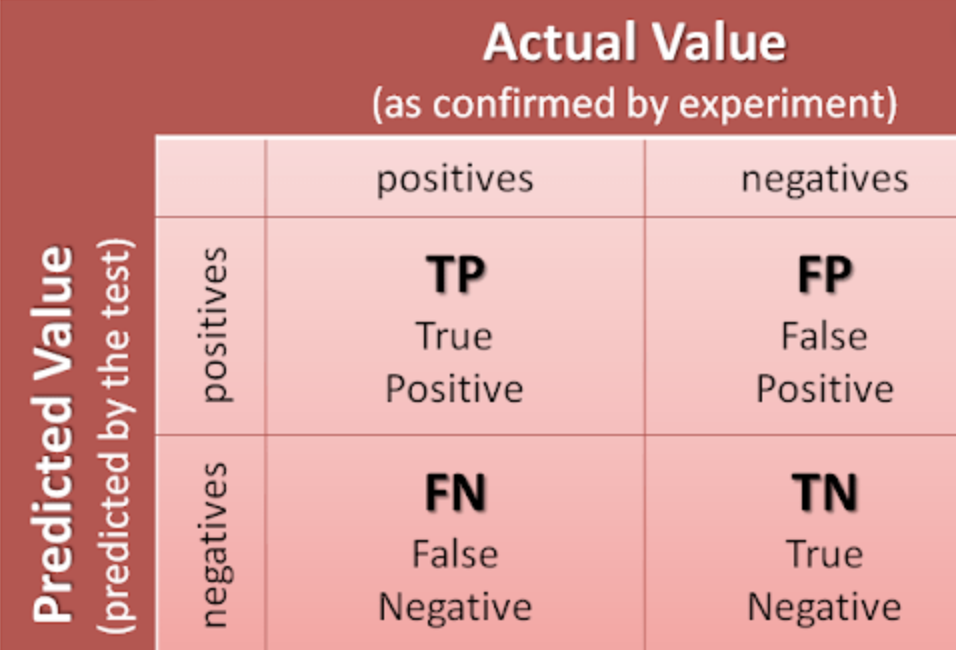


# Accuracy 
the percentage of corrected predictions over all the predictions 


In [31]:
(1514 + 145) / 2000    

0.8295

## Homework


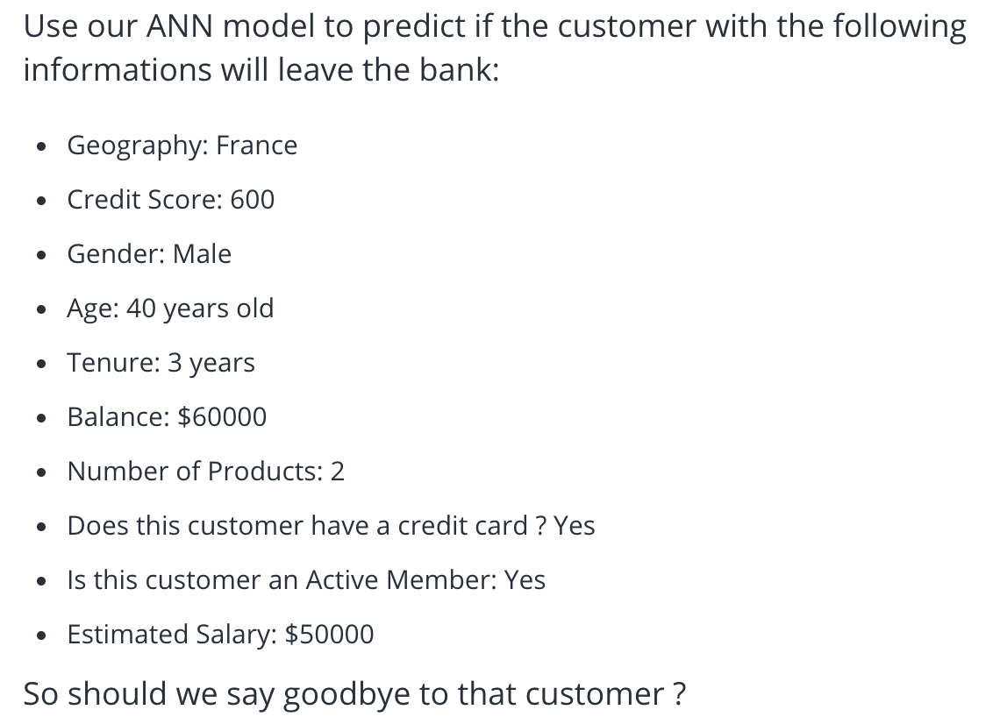

# Solution 

In [34]:
pd.DataFrame(X)   # the dataset processed 

,0,1,2,3,4,5,6,7,8,9,10,11
0,1.0,0.0,0.0,619.0,0.0,42.0,2.0,0.00,1.0,1.0,1.0,101348.88
1,0.0,0.0,1.0,608.0,0.0,41.0,1.0,83807.86,1.0,0.0,1.0,112542.58
2,1.0,0.0,0.0,502.0,0.0,42.0,8.0,159660.80,3.0,1.0,0.0,113931.57
3,1.0,0.0,0.0,699.0,0.0,39.0,1.0,0.00,2.0,0.0,0.0,93826.63
4,0.0,0.0,1.0,850.0,0.0,43.0,2.0,125510.82,1.0,1.0,1.0,79084.10
...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1.0,0.0,0.0,771.0,1.0,39.0,5.0,0.00,2.0,1.0,0.0,96270.64
9996,1.0,0.0,0.0,516.0,1.0,35.0,10.0,57369.61,1.0,1.0,1.0,101699.77
9997,1.0,0.0,0.0,709.0,0.0,36.0,7.0,0.00,1.0,0.0,1.0,42085.58
9998,0.0,1.0,0.0,772.0,1.0,42.0,3.0,75075.31,2.0,1.0,0.0,92888.52


In [35]:
pd.DataFrame(dataset)

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,9996,15606229,Obijiaku,771,France,Male,39,5,0.00,2,1,0,96270.64,0
9996,9997,15569892,Johnstone,516,France,Male,35,10,57369.61,1,1,1,101699.77,0
9997,9998,15584532,Liu,709,France,Female,36,7,0.00,1,0,1,42085.58,1
9998,9999,15682355,Sabbatini,772,Germany,Male,42,3,75075.31,2,1,0,92888.52,1


In [ ]:
#my observation has to be in horizondal vector 
# we need also to encode the variables 

In [39]:
sample = sc.transform(np.array([[1, 0, 0, 600, 1, 40, 3 , 60000, 2 , 1, 1, 50000 ]]))
new_prediction = classifier.predict(sample) 
new_prediction

array([[0.04367898]], dtype=float32)

In [40]:
new_prediction > 0.5

array([[False]])

In [ ]:
## The customers doesn't leave the bank 